In [21]:
import os, sys, time, tqdm, importlib, pickle, json, logging
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import style
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from adjustText import adjust_text
import cmasher as cmr
import seaborn as sns
import scanpy as sc
import squidpy as sq
import scipy.stats as ss
import gseapy
import warnings
warnings.filterwarnings('ignore')
sys.path.append('../src')
from niche_detection import nichescope
from utils import *

style.use('seaborn-v0_8-white')
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

# Data
1. Download processed xenium lymph node crop1 from <u>https://drive.google.com/file/d/1oVS0nxrhf2TGYc3f-HI4dvubIa3uC4E_/view?usp=sharing</u>;
2. Put this data under current directory;
3. Visualize cell type distribution.

In [16]:
## load processed ST data
crop1 = sc.read(f"xenium_crop1.h5ad")
print(f'Crop1: {len(crop1)} cells.')
all_cts = crop1.obs.cell_type.cat.categories
all_subcts = crop1.obs.sub_cell_type.cat.categories
print(f'{len(all_cts)} major cell types, {len(all_subcts)} sub cell types.')
print(f'{crop1.var.highly_variable.sum()} highly variable genes.')

Crop1: 80534 cells.
13 major cell types, 30 sub cell types.
3000 highly variable genes.


In [10]:
## maps
with open('../data/maps/lymph_node_ct_name_map.json', 'r') as f:
    ct_name_dict = json.load(f)
with open('../data/maps/lymph_node_ct_cmap.json', 'r') as f:
    ct_cmap_dict = json.load(f)
with open('../data/maps/niche_cmap.json', 'r') as f:
    niche_cmap_dict = json.load(f)
cmap_niche = mpl.colors.LinearSegmentedColormap.from_list("cmap_niche", list(niche_cmap_dict.values()), N=len(niche_cmap_dict))
cmap_ct = mpl.colors.LinearSegmentedColormap.from_list("cmap_ct", list(ct_cmap_dict.values()), N=len(ct_cmap_dict))
all_ct_names = [ct_name_dict[x] for x in all_cts]

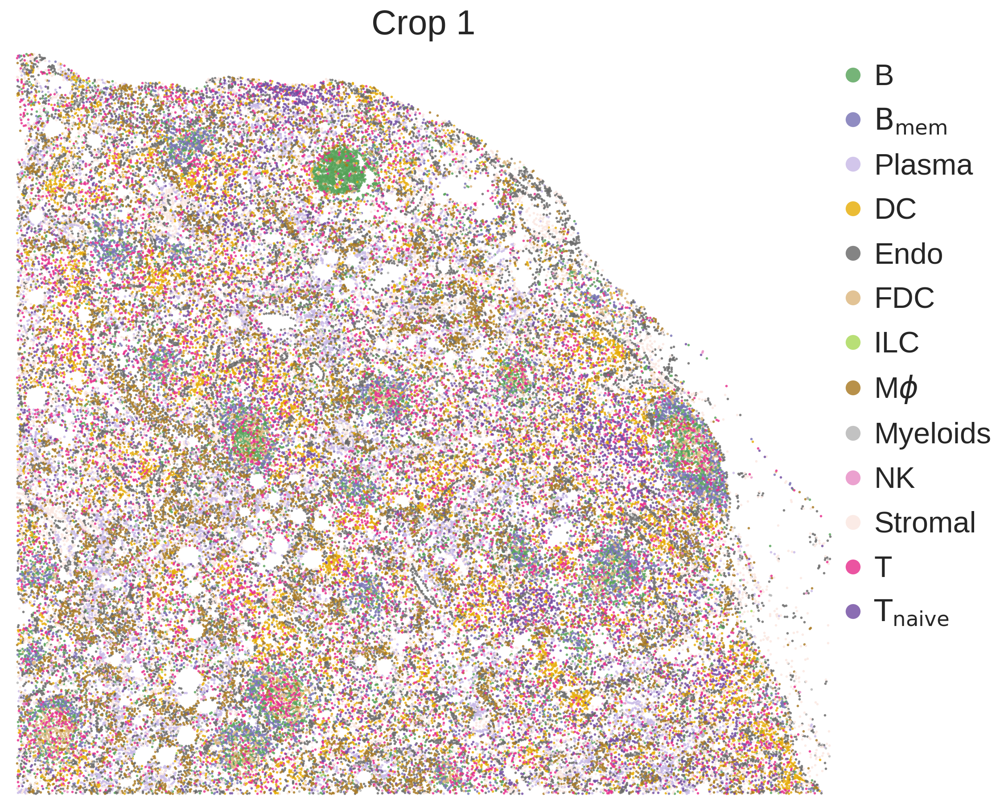

In [13]:
## cell type distribution
fig, ax = plt.subplots(figsize=(12,11), dpi=200)
s = 4
alpha = 0.8
lw = 0
points = crop1.obs.loc[crop1.obs.cell_type.isin(all_cts)].copy()
for (ct, ct_name) in zip(all_cts, all_ct_names):
    points_ = points.loc[points['cell_type']==ct].copy()
    color = ct_cmap_dict[ct]
    ax.scatter(points_['x'], points_['y'], s=s, c=color, alpha=alpha, edgecolors=color, linewidths=lw, label=ct_name)
ax.legend(bbox_to_anchor=(1,0.98), loc="upper left", borderpad=0, borderaxespad=0,
          framealpha=0, markerscale=6, fontsize=24, handletextpad=0.2)
ax.set_title('Crop 1', fontsize=28, pad=10)
ax.margins(0.01,0.01)
plt.gca().invert_yaxis()
plt.axis('off')
plt.show()

# B cell niche detection
Run NicheScope with B cells as the target cell type.  
The main function `nichescope` implements the NicheScope pipeline, including construction of the neighborhood cell-type composition matrix, candidate gene selection, and niche detection via nonnegative sparse CCA.  

Notes on key parameters of `nichescope`:  
* `sigma`: Gaussian kernel bandwidth. Default is 20. With the same cutoff (default 0.05), a larger sigma yields a larger neighborhood around each target cell. NicheScope is relatively robust to this parameter; values of 20 or 40 are commonly used.  
* `n_hvg`: Number of highly variable genes (HVGs). NicheScope uses only the top `n_hvg` HVGs for candidate gene selection, reducing the impact of noisy gene expression.  
* `cca_comp`: Number of CCA components. This should not exceed the number of cell types in the ST dataset; otherwise, the SVD in CCA will fail.  
* `px` and `pz`: Penalty parameters in [0, 1] controlling the sparsity of gene and cell-type coefficients, respectively. Defaults are `px=0.6`, `pz=0.5`. Increasing `px` or `pz` results in more nonzero coefficients, though excessively high values may reduce interpretability.  

Type `?nichescope` for more information on parameters.  

In [22]:
## run nichescope (to suppress debug information of sub functions, setting logger_sub_level=logging.WARNING)
meta1 = nichescope(crop1, 
                   target_ct='B', 
                   sigma=20, 
                   cov_test_null=True,
                   cca_comp=8, 
                   px=0.6, 
                   pz=0.5,
                   logger_sub_level=logging.DEBUG)

[2025-09-27 16:34:33] [nichescope] [INFO] Dataset summary: 80534 cells, 4622 genes.
[2025-09-27 16:34:33] [nichescope] [INFO] 13 cell types: ['B', 'B_mem', 'B_plasma', 'DC', 'Endo', 'FDC', 'ILC', 'Macrophaeges', 'Myeloids', 'NK', 'Stromal', 'T', 'T_naive'].

[2025-09-27 16:34:33] [compute_N] [DEBUG] ct_dummy: (80534, 13).
[2025-09-27 16:34:33] [compute_N] [DEBUG] 7036 B, 80534 cells in total.
[2025-09-27 16:34:39] [nichescope] [INFO] Computed neighborhood composition matrix N of shape (7036, 13).
[2025-09-27 16:34:39] [select_candidate_genes] [DEBUG] cov_X: (2994, 7036); cov_N: (7036, 13)
[2025-09-27 16:34:39] [select_candidate_genes] [DEBUG] 2994 / 2994 genes have pvalue.
[2025-09-27 16:34:39] [select_candidate_genes] [DEBUG] No pvalue genes: [].
[2025-09-27 16:34:39] [select_candidate_genes] [DEBUG] Cov test on permuted data...
[2025-09-27 16:34:42] [nichescope] [INFO] 500 candidate genes: CR2, SERPINA9, LMO2, ...
[2025-09-27 16:34:42] [cca] [DEBUG] cca_X: (7036, 500); cca_N: (7036, 

In [ ]:
## save result
with open(f'xenium_crop1_B.pkl', 'wb') as f:
    pickle.dump(meta1, f)

# Main results
B cell-associated MCNs corresponds to selected biologically meaningful CCA components. Here, we mainly focus on MCN1 and MCN2. Note: MCN1 or MCN2 are not necessarily the first or second CCA components. They are niches localized to GC cores or GC mantle zones, and we named them as MCN1 and MCN2.

## Niche cell types

### Cell type coefficients

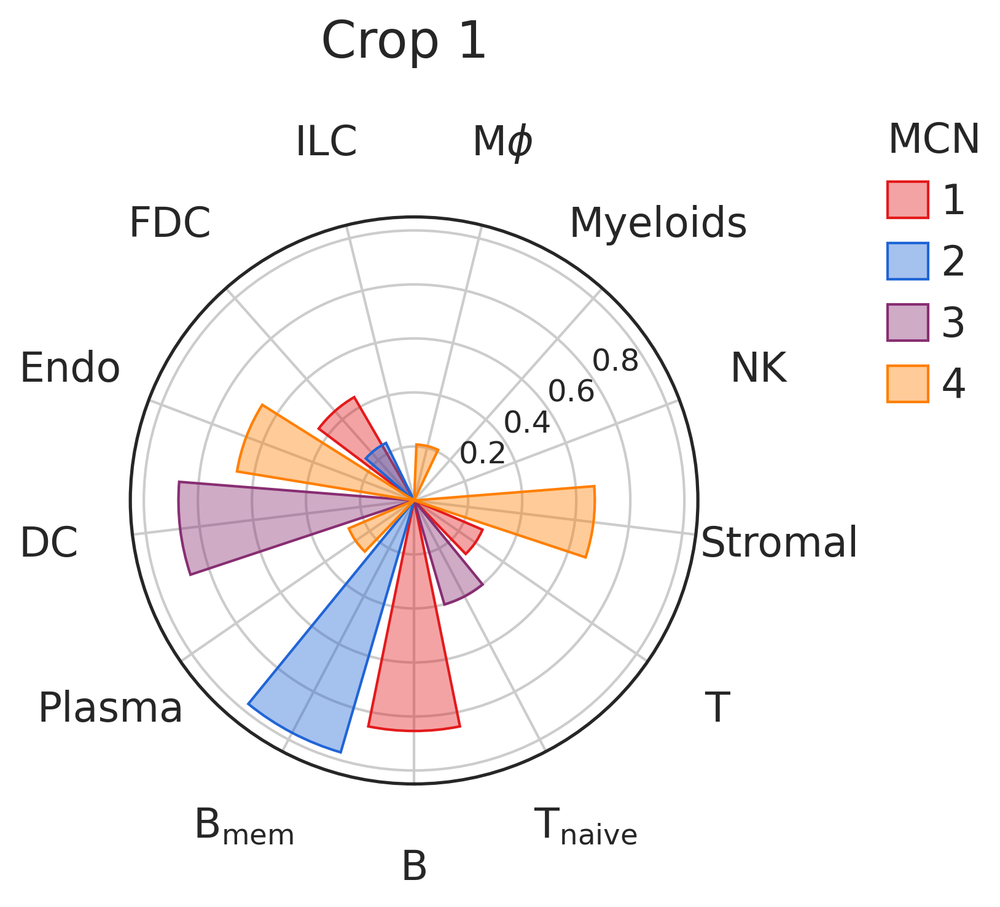

In [65]:
## Niche cell types of B cell-associated MCNs
vdf1 = meta1['vdf']
comps1 = [2, 7, 3, 1]
colors = [cmap_niche(i) for i in range(4)]
xticklabels = [ct_name_dict[x] for x in vdf1.index.tolist()]
draw_v_radar(vdf1, comps1, v_thres=0.2, colors=colors, alpha=0.4, width=0.4, offset=0.07, 
             xticklabels=xticklabels, rlabel_angle=235, figsize=(4,4), dpi=300, xtick_fs=16, xlabel_pad=20, 
             ylim=(0,1.05), yticks=[0.2,0.4,0.6,0.8,1.0], yticklabels=['0.2','0.4','0.6','0.8',''], ytick_fs=12, 
             leg_loc='upper right', leg_pos=(1.5,1.17), leg_ncol=1, leg_title='MCN', leg_fs=16, leg_title_fs=16, 
             title='Crop 1', title_fs=20, title_y=1.15)


### Spaital distribution

In [68]:
def draw_niche_ct_spatial(crop, cts, cts_names, colors, ylabel=None, figsize=(8,8), invert_yaxis=True):

    fig, ax = plt.subplots(figsize=figsize, dpi=200)

    ## background
    for ct in all_subcts:
        if ct not in cts:
            points_ = crop.obs.loc[crop.obs['sub_cell_type']==ct].copy()
            ax.scatter(points_['x'], points_['y'], s=6, c='#F8F8F8', edgecolors='#F8F8F8', alpha=1, lw=0)
    ## niche cell types
    for ct, color in zip(cts, colors):
        if ct in all_cts:
            points_ = crop.obs.loc[crop.obs['cell_type']==ct].copy()
        else:
            points_ = crop.obs.loc[crop.obs['sub_cell_type']==ct].copy()
        ax.scatter(points_['x'], points_['y'], s=6, facecolors=color,edgecolors=color, alpha=0.7, lw=0.5, label=ct)
    
    ax.set_ylabel(ylabel, fontsize=24)
    ax.margins(0.01,0.01)
    if invert_yaxis:
        plt.gca().invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    for s in ['top', 'bottom', 'right', 'left']:
        ax.spines[s].set_visible(False)

    leg = ax.legend(bbox_to_anchor=(0.5,1.02), loc='lower center', 
                    borderpad=0, borderaxespad=0, ncol=3,
                    framealpha=0, markerscale=4, fontsize=20, 
                    handletextpad=0.2, columnspacing=0.5)


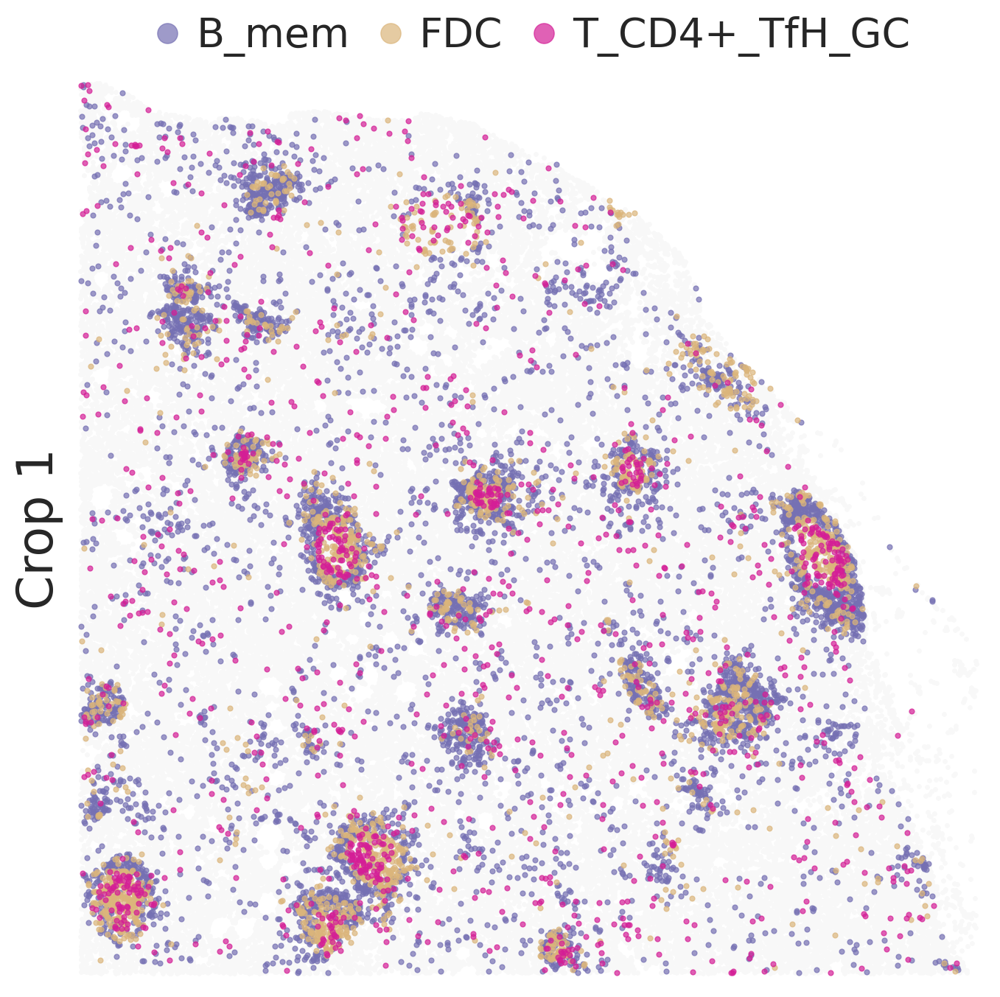

In [69]:
cts = ['B_mem', 'FDC', 'T_CD4+_TfH_GC']
cts_names = [r'$\text{B}_{\text{mem}}$', 'FDC', 'Tfh']
colors = ['#7570b3', '#dbb57b', '#d41e96']
draw_niche_ct_spatial(crop1, cts, cts_names, colors, 'Crop 1')

## Niche scores

### MCN1

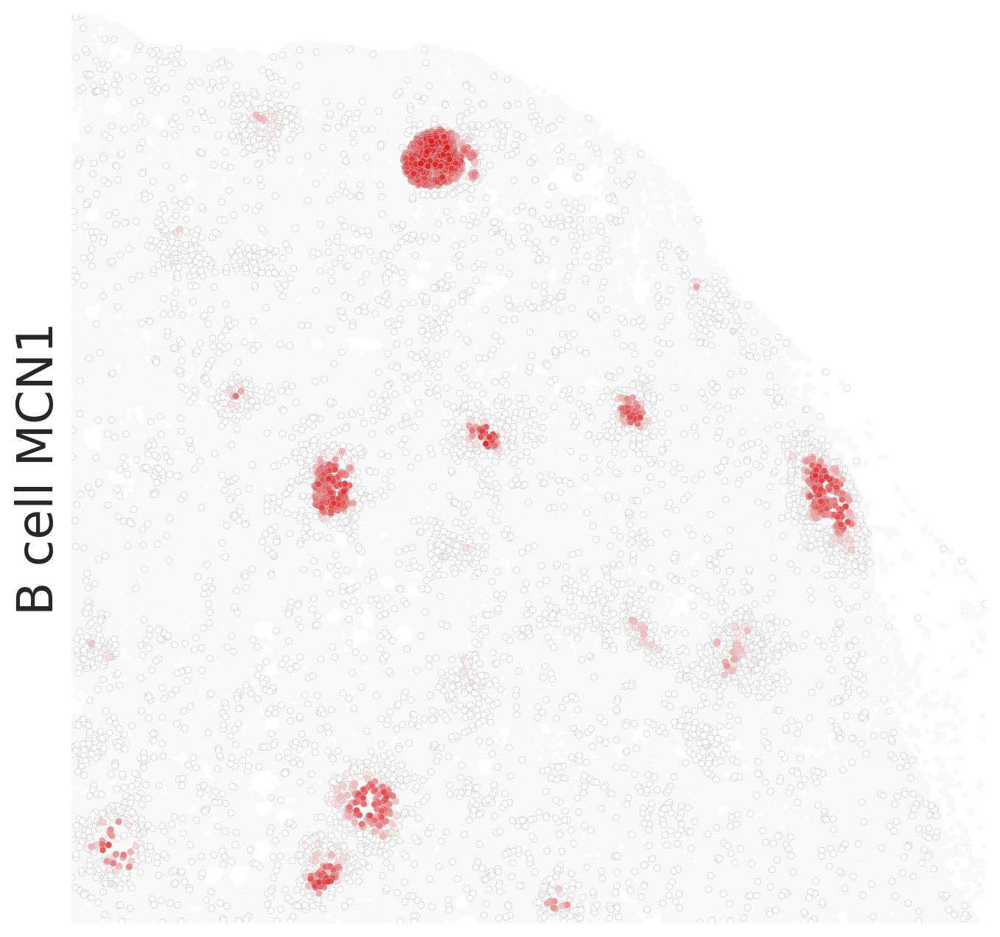

In [70]:
cmap_niche_score = mpl.colors.LinearSegmentedColormap.from_list('cmap_niche_score', ['#FFFFFF', cmap_niche(0)])
draw_niche_score_spatial(crop1, meta1['score_df'], 'S_comp2', target_ct='B', 
                         draw_bg=True, bg_color='#F8F8F8', ms_bg=10, sort_score=True, 
                         cmap=cmap_niche_score, target_ec='#C0C0C0', ms=10, lw=0.2, 
                         window=None, window_lw=4, window_ls='--', window_lc='k', 
                         ylabel='B cell MCN1', ylabel_fs=24, title=None, title_fs=24, 
                         show_colorbar=False, cb_label=None, cb_tick_fs=20, 
                         figsize=(8,8), dpi=200, no_ticks=True, 
                         aspect='auto', invert_yaxis=True)

### MCN2

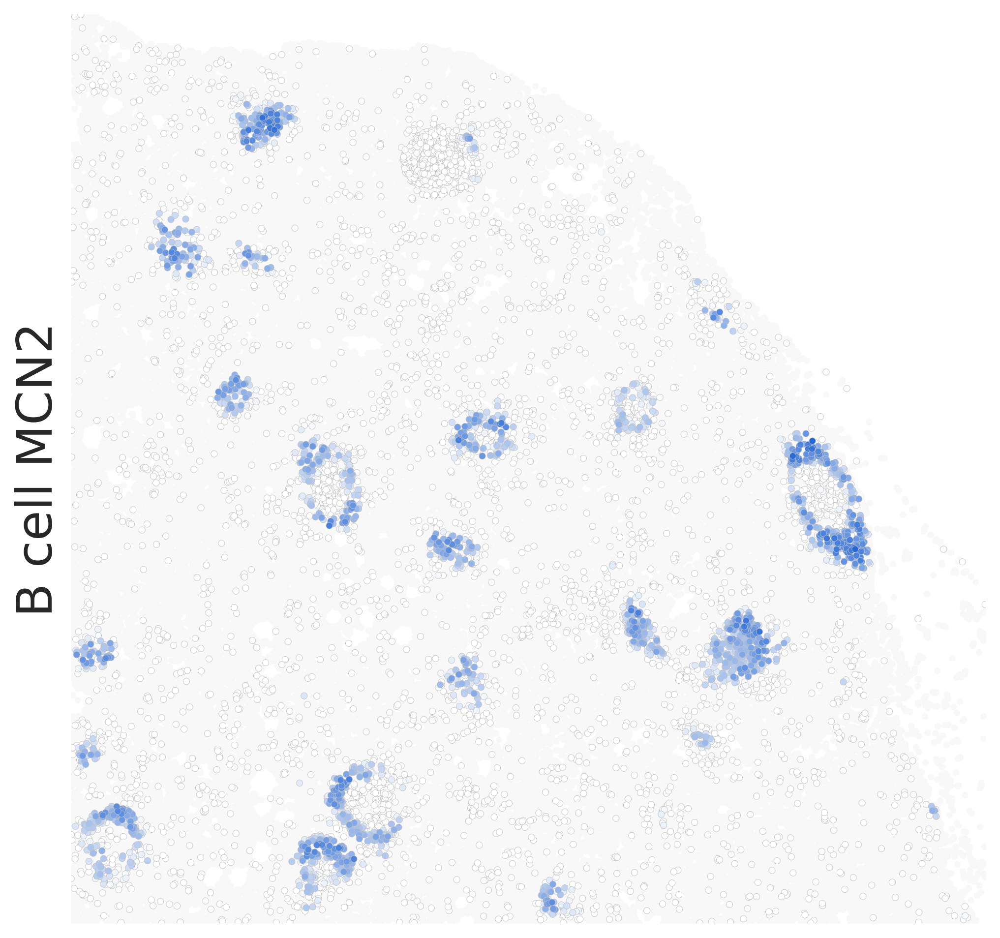

In [71]:
cmap_niche_score = mpl.colors.LinearSegmentedColormap.from_list('cmap_niche_score', ['#FFFFFF', cmap_niche(1)])
draw_niche_score_spatial(crop1, meta1['score_df'], 'S_comp7', target_ct='B', 
                         draw_bg=True, bg_color='#F8F8F8', ms_bg=10, sort_score=True, 
                         cmap=cmap_niche_score, target_ec='#C0C0C0', ms=10, lw=0.2, 
                         window=None, window_lw=4, window_ls='--', window_lc='k', 
                         ylabel='B cell MCN2', ylabel_fs=24, title=None, title_fs=24, 
                         show_colorbar=False, cb_label=None, cb_tick_fs=20, 
                         figsize=(8,8), dpi=300, no_ticks=True, 
                         aspect='auto', invert_yaxis=True)

## Niche genes

### MCN1

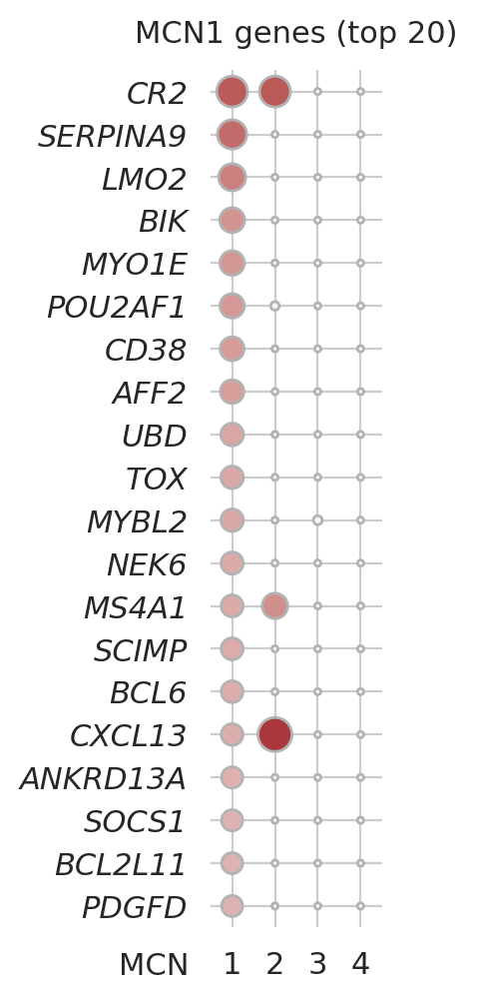

In [84]:
## niche genes ordered by gene coefficients of MCN1
udf1 = meta1['udf']
n_top_gene = 20
h = 0.25 * n_top_gene
xticklabels = range(1,len(comps1)+1)
mx = 0.5/(len(comps1)-1)
my = 0.5/(n_top_gene-1)
comp = 2
g = draw_u_dotmap(udf1, comp, comps1, n_top_gene, sizes=(5, 150), xticklabels=xticklabels, aspect_equal=True,
                fs=11, h=h, w=3, title=f'MCN1 genes (top {n_top_gene})', mx=mx, my=my, no_leg=True, dpi=200)

### MCN2

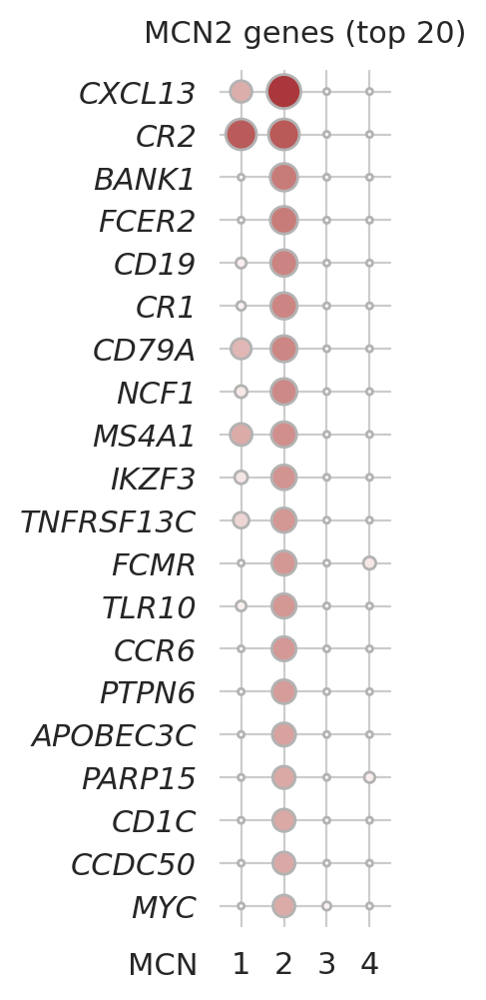

In [85]:
## niche genes ordered by gene coefficients of MCN2
udf1 = meta1['udf']
n_top_gene = 20
h = 0.25 * n_top_gene
xticklabels = range(1,len(comps1)+1)
mx = 0.5/(len(comps1)-1)
my = 0.5/(n_top_gene-1)
comp = 7
g = draw_u_dotmap(udf1, comp, comps1, n_top_gene, sizes=(5, 150), xticklabels=xticklabels, aspect_equal=True,
                fs=11, h=h, w=3, title=f'MCN2 genes (top {n_top_gene})', mx=mx, my=my, no_leg=True, dpi=200)

## Pathways

In [87]:
gene_sets = ['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2025','Reactome_2022']

### MCN1

genes number: 109 -> 100


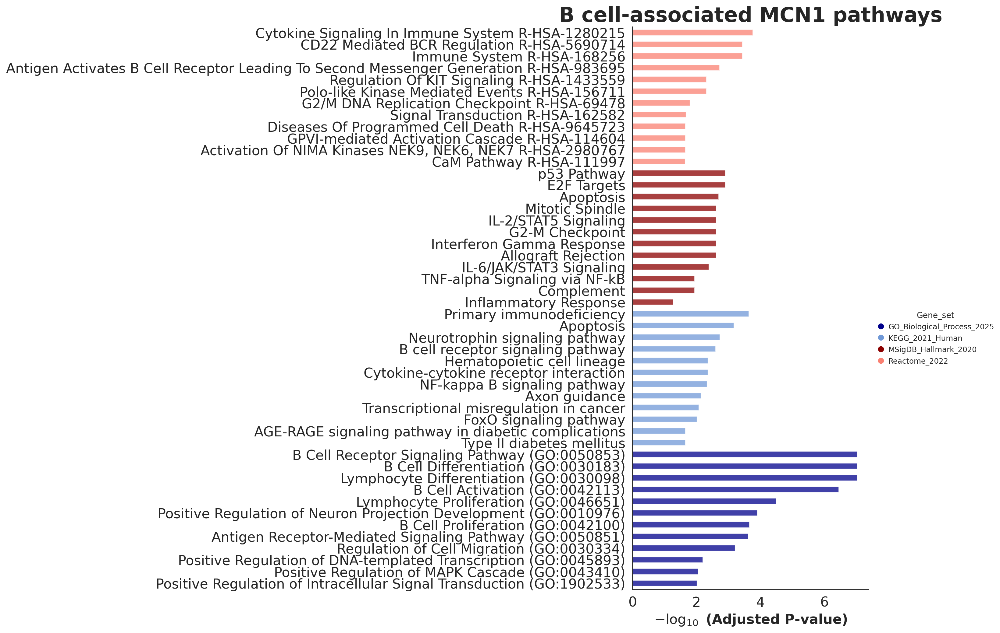

In [88]:
## pathway
ora_comp = 'comp2'
enr_u_thres = 0.05
enr_n_top = 100
glist_ = udf1.loc[udf1[ora_comp] > enr_u_thres].sort_values(ora_comp, ascending=False)
glist = glist_.iloc[:enr_n_top].index.tolist()
print(f'genes number: {len(glist_)} -> {len(glist)}')
enr = gseapy.enrichr(gene_list=glist,organism='Human',gene_sets=gene_sets,cutoff = 0.1)
sns.set_style('white')
with mpl.rc_context({'figure.dpi': 200}):
    gseapy.barplot(enr.results,
                   title=r"B cell-associated MCN1 pathways",
                   cutoff=0.1,
                   column="Adjusted P-value",
                   group='Gene_set', 
                   size=10,
                   top_term=12,
                   figsize=(5,12),
                   color=['darkblue','#7099d7','darkred','salmon'] 
                  )

### MCN2

genes number: 86 -> 86


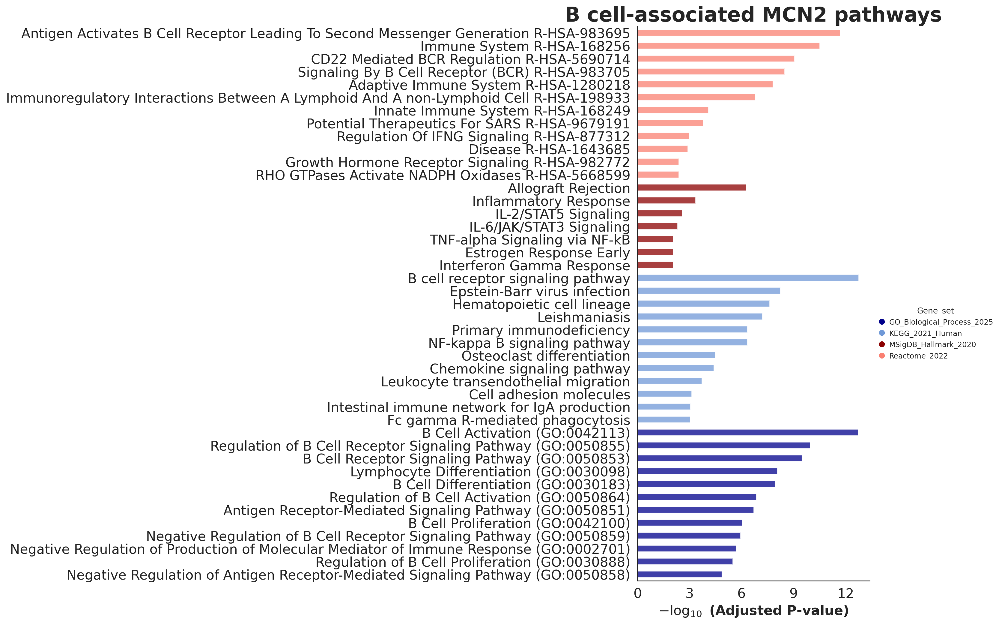

In [89]:
## pathway
ora_comp = 'comp7'
enr_u_thres = 0.05
enr_n_top = 100
glist_ = udf1.loc[udf1[ora_comp] > enr_u_thres].sort_values(ora_comp, ascending=False)
glist = glist_.iloc[:enr_n_top].index.tolist()
print(f'genes number: {len(glist_)} -> {len(glist)}')
enr = gseapy.enrichr(gene_list=glist,organism='Human',gene_sets=gene_sets,cutoff = 0.1)
sns.set_style('white')
with mpl.rc_context({'figure.dpi': 200}):
    gseapy.barplot(enr.results,
                   title=r"B cell-associated MCN2 pathways",
                   cutoff=0.1,
                   column="Adjusted P-value",
                   group='Gene_set', 
                   size=10,
                   top_term=12,
                   figsize=(5,12),
                   color=['darkblue','#7099d7','darkred','salmon'] 
                  )

## Sub cell type enrichment

In [90]:
## compute enrichement fold
subcts = ['B_GC_LZ', 'B_GC_DZ', 'B_Cycling', 'B_activated', 'B_naive', 'B_preGC', 'B_IFN']
sub11 = sub_ct_enrich(2, meta1['score_df'].copy(), subcts, [0.5,0.75,0.9,0.95], 0.9)
sub21 = sub_ct_enrich(7, meta1['score_df'].copy(), subcts, [0.5,0.75,0.9,0.95], 0.9)

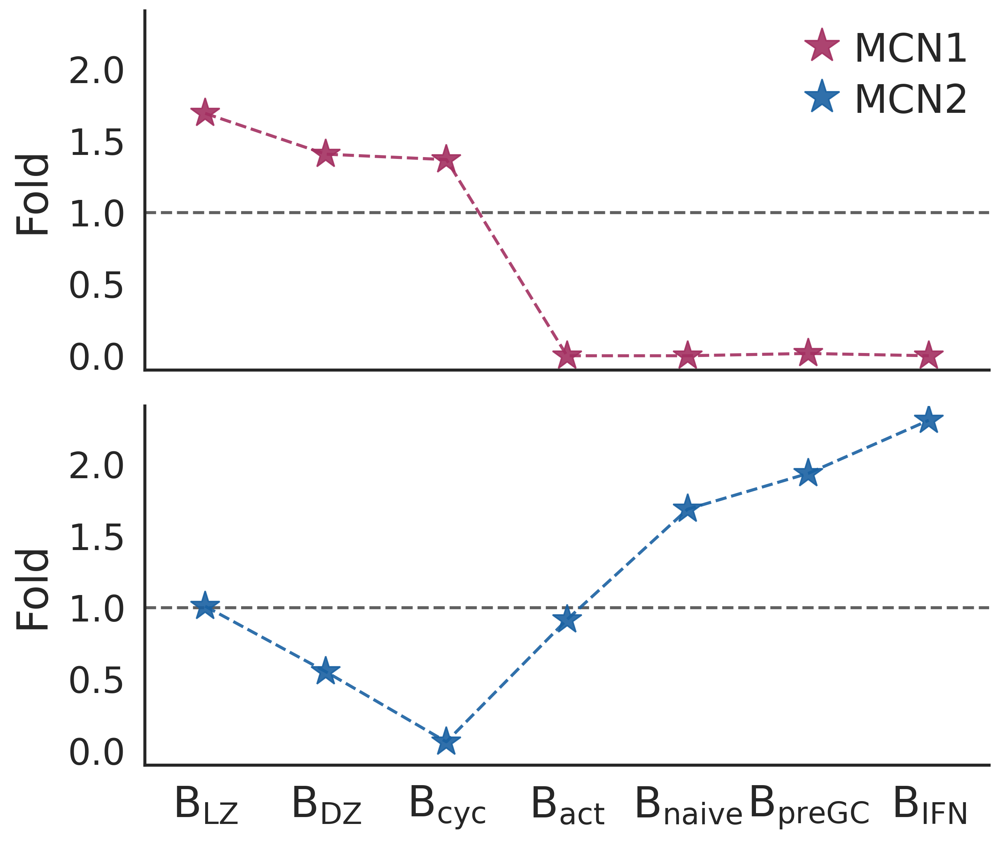

In [100]:
## plot
xranges = np.arange(len(subcts))
offset = 0.3
xranges11 = xranges
xranges21 = xranges
col = 'fold_09'
y11 = sub11.loc[subcts][col].values
y21 = sub21.loc[subcts][col].values
colors = ['#a32f61', '#1961a2']
alpha = 0.9
marker = '*'
ms = 20
lw = 2
label_fs = 28
tick_fs = 24
lgd_fs = 26
ymax = np.max([np.max(y11), np.max(y21)])

fig, ax = plt.subplots(2, 1, figsize=(10,9), dpi=300)
ax[0].axhline(1, ls='dashed', lw=lw, color='#606060')
ax[1].axhline(1, ls='dashed', lw=lw, color='#606060')
ax[0].plot(xranges11, y11, marker=marker, ms=ms, ls='dashed', lw=lw, color=colors1[0], alpha=alpha, label='Crop 2')
ax[1].plot(xranges21, y21, marker=marker, ms=ms, ls='dashed', lw=lw, color=colors2[0], alpha=alpha, label='Crop 2')

for i in range(2):
    ax[i].set_xticks([])
    ax[i].set_xlim([-0.5, 6.5])
    ax[i].set_ylim([-0.1, ymax+0.1])
    ax[i].set_yticks(np.arange(0,2.1,0.5))
    ax[i].set_yticklabels(np.arange(0,2.1,0.5), fontsize=tick_fs)
    ax[i].set_ylabel('Fold', fontsize=label_fs, labelpad=10)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    for side in ['bottom', 'left']:
        ax[i].spines[side].set_linewidth(2)
    ax[i].tick_params(axis='both', pad=8)
ax[1].set_xticks(xranges)
ax[1].set_xticklabels([r"$\text{B}_{\text{LZ}}$",
                       r"$\text{B}_{\text{DZ}}$",
                       r"$\text{B}_{\text{cyc}}$",
                       r"$\text{B}_{\text{act}}$",
                       r"$\text{B}_{\text{naive}}$",
                       r"$\text{B}_{\text{preGC}}$",
                       r"$\text{B}_{\text{IFN}}$"], fontsize=label_fs, ha='center')
ms_scale = 1.2
legend1_patches = [mlines.Line2D([0], [0], marker=marker, ms=ms*ms_scale, color=colors[0], lw=0, label='MCN1', alpha=alpha),
                   mlines.Line2D([0], [0], marker=marker, ms=ms*ms_scale, color=colors[1], lw=0, label='MCN2', alpha=alpha)]
legend1 = ax[0].legend(handles=legend1_patches, loc='upper right', bbox_to_anchor=(1.0,1.0), handletextpad=0.3, labelspacing=0.3,
                    title=None, alignment='left', fontsize=lgd_fs, title_fontsize=lgd_fs)

plt.subplots_adjust(hspace=0.1)